In [1]:
! pip install -qU "python-gdcm" pydicom pylibjpeg "opencv-python-headless" "scikit-image" "ipywidgets" "dicomsdl"

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.1/13.1 MB 101.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.8/14.8 MB 92.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.8/139.8 kB 9.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 55.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 216.6/216.6 kB 14.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 74.6 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
bigframes 1.36.0 requires rich<14,>=12.4.4, but you have rich 14.0.0 which is incompatible.


In [2]:
# 1. Uninstall the old, incompatible torch
!pip uninstall -y torch torchvision torchaudio

Found existing installation: torch 2.5.1+cu124
Uninstalling torch-2.5.1+cu124:
  Successfully uninstalled torch-2.5.1+cu124
Found existing installation: torchvision 0.20.1+cu124
Uninstalling torchvision-0.20.1+cu124:
  Successfully uninstalled torchvision-0.20.1+cu124
Found existing installation: torchaudio 2.5.1+cu124
Uninstalling torchaudio-2.5.1+cu124:
  Successfully uninstalled torchaudio-2.5.1+cu124


In [3]:
# 1. Clone YOLOv5
!git clone https://github.com/ultralytics/yolov5.git /kaggle/working/yolov5

# 2. Install its Python requirements
!pip install -r /kaggle/working/yolov5/requirements.txt

Cloning into '/kaggle/working/yolov5'...
remote: Enumerating objects: 17485, done.
remote: Counting objects: 100% (111/111), done.
remote: Compressing objects: 100% (80/80), done.
remote: Total 17485 (delta 81), reused 31 (delta 31), pack-reused 17374 (from 3)
Receiving objects: 100% (17485/17485), 16.39 MiB | 20.64 MiB/s, done.
Resolving deltas: 100% (11986/11986), done.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 865.2/865.2 MB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 393.1/393.1 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.9/8.9 MB 105.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 80.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 897.7/897.7 kB 49.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 571.0/571.0 MB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 200.2/200.2 MB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 53.8 MB/s et

In [4]:
# 1. Handle datasets
import io
import os
import cv2
import random
import torch
import numpy as np
import pandas as pd
from PIL import Image
from glob import glob
from pathlib import Path
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from skimage.transform import resize
from PIL import Image, ImageDraw
from pathlib import Path
from collections import Counter
from joblib import Parallel, delayed
from tqdm import tqdm
import imageio
import gc

In [5]:
parent_dir = "/kaggle/input/jp2000"
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = torch.hub.load(
    './yolov5', 
    'custom', 
    path="/kaggle/input/roi-rsna/rsna-roi-003.pt", 
    source='local'
)
model.to(device)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


YOLOv5 🚀 v7.0-418-ga493afe1 Python-3.11.11 torch-2.7.0+cu126 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 


AutoShape(
  (model): DetectMultiBackend(
    (model): DetectionModel(
      (model): Sequential(
        (0): Conv(
          (conv): Conv2d(3, 32, kernel_size=(6, 6), stride=(2, 2), padding=(2, 2))
          (act): SiLU(inplace=True)
        )
        (1): Conv(
          (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (act): SiLU(inplace=True)
        )
        (2): C3(
          (cv1): Conv(
            (conv): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (cv2): Conv(
            (conv): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (cv3): Conv(
            (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (m): Sequential(
            (0): Bottleneck(
              (cv1): Conv(
                (conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1))
  

In [6]:
model.children()

<generator object Module.children at 0x7c2f7bbdc580>

In [7]:
torch.cuda.empty_cache()
file_list = glob(
    os.path.join(parent_dir, "train_image_processed_jp2000_512", "*", "*.jp2")
)

In [8]:
%matplotlib inline

images = []

for path in random.sample(file_list, 25):
    frame = plt.imread(path)
    
    # Convert to PIL Image
    img_pil = Image.fromarray(frame)
    draw = ImageDraw.Draw(img_pil)

    detections = model(frame)
    results = detections.pandas().xyxy[0].to_dict(orient="records")
    
    for result in results:
        xmin, ymin = int(result['xmin']), int(result['ymin'])
        xmax, ymax = int(result['xmax']), int(result['ymax'])
        draw.rectangle([(xmin, ymin), (xmax, ymax)], outline='red', width=4)
    
    images.append(np.array(img_pil))

/kaggle/working/./yolov5/models/common.py:907: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/kaggle/working/./yolov5/models/common.py:907: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/kaggle/working/./yolov5/models/common.py:907: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/kaggle/working/./yolov5/models/common.py:907: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/kaggle/working/./yolov5/models/common.py:907: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autoca

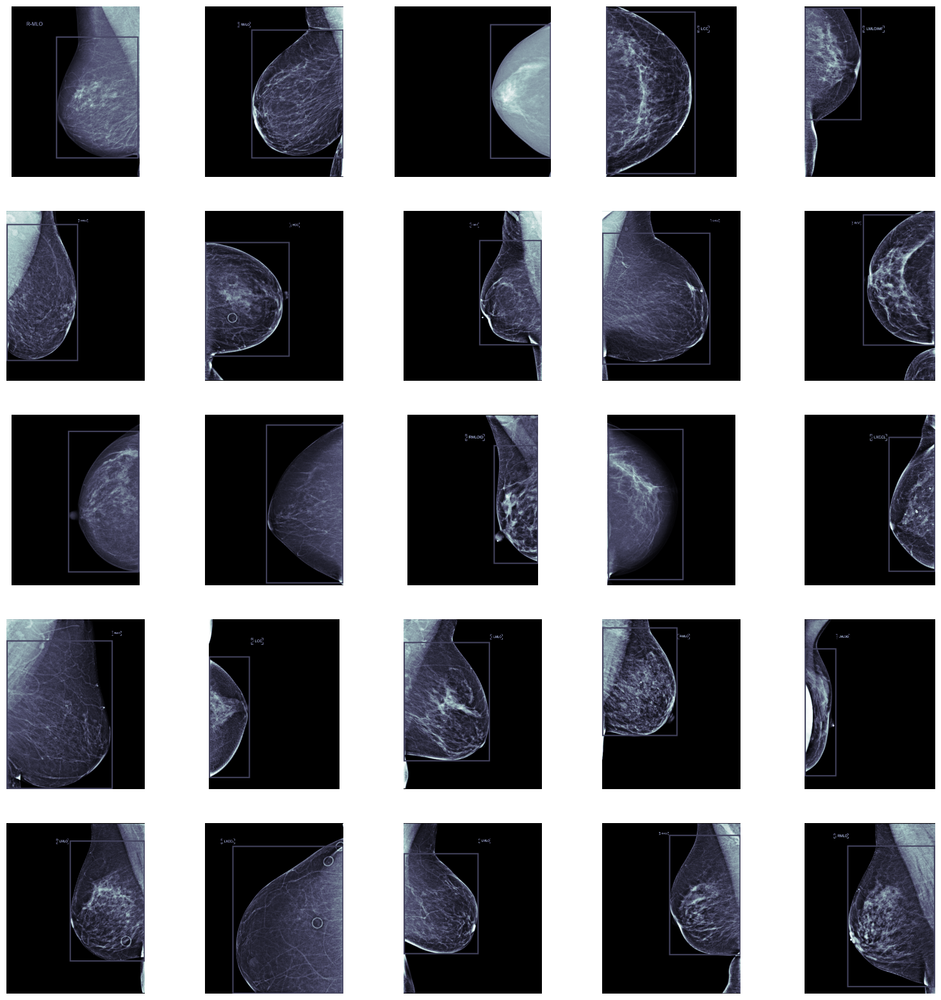

In [9]:
fig, axes = plt.subplots(5, 5, figsize=(20,20))
    
for idx, image in enumerate(images):
    i = idx % 5 
    j = idx // 5 
    axes[i, j].imshow(image, cmap="bone")
    axes[i, j].axis('off')

plt.subplots_adjust(wspace=0, hspace=.2)
plt.show()



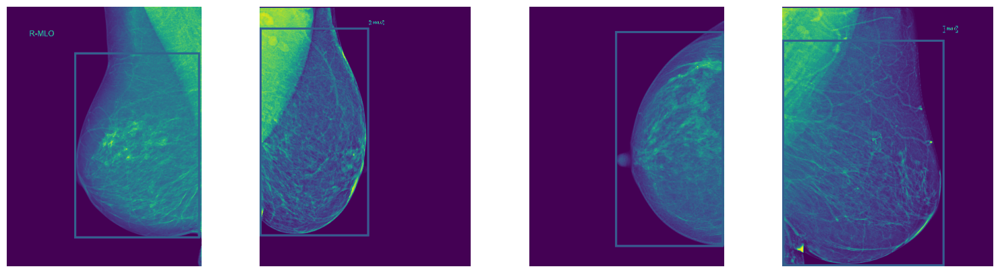

In [10]:
fig, axes = plt.subplots(1, 4, figsize=(20, 5))
axes = axes.flatten()

for ax, img in zip(axes, images[:4]):
    ax.imshow(img)
    ax.axis('off')

plt.subplots_adjust(wspace=0, hspace=0.2)
plt.show()

In [11]:
# === CONFIG ===
RESIZE_TO = 512
SAVE_DIR = f"/kaggle/working/train_image_ROI_processed_jp2000_{RESIZE_TO}"
parent_dir = "/kaggle/input/jp2000"

# Gather all .jp2 paths
all_jp2_files = list(
    Path(os.path.join(parent_dir, "train_image_processed_jp2000_512")).rglob("*.jp2")
)
fail_counter = Counter()
model.eval()

# === CLEANING ===
def cleanup():
    gc.collect()
    torch.cuda.empty_cache()

# === RESIZE ===
def image_resize(image, width=None, height=None):
    (h, w) = image.shape[:2]

    if width is None and height is None:
        return image

    if width is None:
        r = height / float(h)
        dim = (int(w * r), height)
    else:
        r = width / float(w)
        dim = (width, int(h * r))

    resized = resize(image, (dim[1], dim[0]), preserve_range=True, anti_aliasing=True)
    return resized.astype(np.uint8)

# === MAIN PROCESSING FUNCTION ===
def extract_and_roi(path):
    try:
        if not path.exists() or not path.is_file():
            fail_counter["invalid_path"] += 1
            print(f"[ERROR] Invalid path: {path}")
            return
        
        parent_folder = path.parent.name
        save_subdir = os.path.join(parent_dir, SAVE_DIR, parent_folder)
        os.makedirs(save_subdir, exist_ok=True)

        image = plt.imread(str(path))
        if image.dtype != np.uint8:
            image = (image * 255).astype(np.uint8)
        
        # Ensure image loaded correctly
        if image is None:
            raise ValueError("Could not load image")
        
        # Check if the image is valid
        if image.shape[0] == 0 or image.shape[1] == 0:
            fail_counter["invalid_image"] += 1
            print(f"[ERROR] Image is empty: {path}")
            return
        
        results = model(image)
        detections = results.pandas().xyxy[0]
        
        if len(detections) == 0:
            fail_counter["no_roi"] += 1
            return

        for i, det in detections.iterrows():
            x1, y1, x2, y2 = map(int, [det["xmin"], det["ymin"], det["xmax"], det["ymax"]])
            
            # Check for valid ROI dimensions
            if x1 < 0 or y1 < 0 or x2 > image.shape[1] or y2 > image.shape[0]:
                fail_counter["invalid_roi"] += 1
                print(f"[ERROR] Invalid ROI for {path}: {x1}, {y1}, {x2}, {y2}")
                continue
            
            roi = image[y1:y2, x1:x2]
            roi_resized = image_resize(roi, width=RESIZE_TO)
            
            save_path = os.path.join(save_subdir, f"{path.stem}.jp2")
            try:
                imageio.imwrite(save_path, roi_resized, format='JP2')
            except Exception as e:
                print(f"[ERROR] Failed to save ROI for {path}: {e}")
                fail_counter["save_error"] += 1

            # === For sanity Check === 
            # return save_path
        
            # Clean up memory
            cleanup()

    except Exception as e:
        print(f"[ERROR] Failed processing {path} — {e}")
        fail_counter["fail"] += 1

# === Sanity Check ===
# for path in tqdm(all_jp2_files[:1], desc="Sanity Check"):
#     save_path = extract_and_roi(path)
#     img = plt.imread(save_path)
#     plt.imshow(img, cmap="turbo")
#     print("✅ Sanity check complete.")
#     print(f"image size = {img.shape}")
    
#     plt.axis('off')
#     plt.show()
#     break

# === RUN ===
Parallel(n_jobs=16, backend="loky", prefer="threads")(
    delayed(extract_and_roi)(path) for path in tqdm(all_jp2_files)
)

print(f"✅ Done! Processed {len(all_jp2_files)} images.")
print(f"❌ Failed: {fail_counter['fail']}, ",
      f"No ROI: {fail_counter['no_roi']}, ",
      f"Invalid Path: {fail_counter['invalid_path']}, ",
      f"Invalid Image: {fail_counter['invalid_image']}," 
      f"Save Errors: {fail_counter['save_error']}")

  0%|          | 16/54706 [00:19<1:11:56, 12.67it/s]/kaggle/working/yolov5/models/common.py:907: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/kaggle/working/yolov5/models/common.py:907: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/kaggle/working/yolov5/models/common.py:907: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
/kaggle/working/yolov5/models/common.py:907: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):
  0%|          | 32/54706 [00:23<12:54:39,  1.18it/s]/kaggle/working/yolov5/models/common.py:907: FutureWarning: `torch.cuda.amp.autocast(args...)` is d

✅ Done! Processed 54706 images.
❌ Failed: 0,  No ROI: 0,  Invalid Path: 0,  Invalid Image: 0,Save Errors: 0
